# PROJECT GOALS

- Clean the initial data and prepare it for analysis. Record anomalies.
- By means of vizualizations and statistical techniques find segments which bring best quality traffic.
- Build a simple model predicting whether a user will make a deposit or not. Try to tune it to achieve better classification scores.

The project is divided into 5 parts, each corresponding to the goal specified above. The suggested questions to answer mentioned in the description file are covered though not in the order they are presented.

# LIBRARIES USED

In [3]:
# import standard libraries
import numpy as np
import pandas as pd
import copy

# import libraries for vizualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import pylab
from IPython.display import Image

# import statistics and ML libraries
import scipy.stats as ss
from statsmodels.stats.proportion import proportions_ztest
import statsmodels.stats.api as sms
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import precision_recall_curve

# PART 1. PRELIMINARY PROCEDURES: MERGING TWO INITIAL DATASETS AND FIRST LOOK AT THE WHOLE DATASET.

In [4]:
# load the main dataset
main = pd.read_csv('synthetic_data.csv', usecols=[1, 2, 3, 4, 5, 6])

# load the subdataset
sub = pd.read_csv('countries.csv')

In [5]:
# compare the number of unique clients in both datasets
print('The number of clients that are present in the subdaset, but not present in the main dataset is {}.'.format(len(set(sub['client_id']).difference(set(main['client_id'])))))
print('The number of clients that are present in the main dataset, but not present in the subdaset is {}.'.format(len(set(main['client_id']).difference(set(sub['client_id'])))))


The number of clients that are present in the subdaset, but not present in the main dataset is 0.
The number of clients that are present in the main dataset, but not present in the subdaset is 61754.


In [6]:
# inspect the occurence of clients in the main dataset
if len(main)==main['client_id'].nunique():
    print('Each client occures only once in the main dataset.')
else:
    print('Some clients occure more than once in the main dataset.')

Each client occures only once in the main dataset.


In [7]:
# get rid of duplicates in the subdatset
sub = sub[~sub.duplicated()]

# left join the main dataset with the subdaset
data = main.merge(sub, on='client_id', how='left')

# move client_id column to the index
data.set_index('client_id', inplace=True)

In [8]:
# print first rows of the data
print(data.head())

           depo      segment    channel  clicks   latency country
client_id                                                        
1442498       0  postid_4057        smm     1.0  2.649725      IT
7865631       0     telegram  affiliate    10.0  2.610846      LU
8165584       0  postid_8542   facebook    13.0  3.001162      MO
5893056       0     telegram     direct     0.0  1.788369      US
3780924       0     telegram        smm     0.0  1.932069      FR


Since different postids represent one segment, one will need to update this column so that there are only two unique segment types.

In [9]:
# check that there are indeed only two unique types
if data[data['segment']!='telegram']['segment'].apply(lambda x: x[:6]).unique()[0]=='postid':
    print('There are only two unique types in the column segment.')
else:
    print('Mistake.')

There are only two unique types in the column segment.


In [10]:
# update the column
data['segment'] = data['segment'].apply(lambda x: x if x=='telegram' else 'article')

In [11]:
# print types of the data
print(data.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 219314 entries, 1442498 to 1817855
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   depo     219314 non-null  int64  
 1   segment  219314 non-null  object 
 2   channel  217142 non-null  object 
 3   clicks   219314 non-null  float64
 4   latency  219314 non-null  float64
 5   country  157560 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 11.7+ MB
None


As expected, country column includes 61754 NaN values. This is due to the fact that some client_ids in the main dataset do not have corresponding values in the subdataset, i.e. there is no country value for some client_ids. Moreover, threre are some NaN values in the channel column, but its proportion is insignificant. Finally, since clicks represent integers, lets covert the values of this column into integers.

In [12]:
# update the column
data['clicks'] = data['clicks'].apply(lambda x: int(x))

In [13]:
# inspect how numerical variables are distributed
print(data.describe())

                depo         clicks        latency
count  219314.000000  219314.000000  219314.000000
mean       22.361217      11.430114       3.021579
std       397.835611      12.628842       1.048472
min      -164.000000       0.000000       0.000071
25%         0.000000       0.000000       2.320726
50%         0.000000       8.000000       3.001301
75%         0.000000      19.000000       3.693649
max     31675.000000      50.000000      11.016521


The major part of depo column values constitute zeros, i.e. the largest part of the users represents leads. A relatively high variation in values is also obsereved. A similar conclusions can be drawn for the clicks column. The last column latency is more stable in variation: most values are concentrated around 3. Futher conclusions can be made only after slicing the dataset into groups.  

Depo column contains some negative values, which is counterintuitive. Lets inspect the corresponding rows in detail.

In [14]:
# insepct the rows with negative depo values
print(data[data['depo']<0])

           depo   segment       channel  clicks   latency country
client_id                                                        
5930737      -3  telegram  social media       0  3.393788      LU
5131530      -6  telegram  social media       4  1.906850      FR
5818342     -20  telegram        direct      31  2.078781      IN
7328151     -51  telegram           smm      15  3.526251      IN
7255781      -7  telegram      facebook       0  3.285896      IN
...         ...       ...           ...     ...       ...     ...
3804151     -55  telegram           smm       0  4.058470     NaN
3227356     -24  telegram  social media      26  3.953449     NaN
7803265      -3  telegram           smm      11  2.687395     NaN
1335525     -13  telegram  social media       0  3.000000     NaN
4016894     -39  telegram           smm      15  1.927501     NaN

[108 rows x 6 columns]


At first sight nothing special is observed. The number of such rows is small relatively to the whole dataset, so I suggest dropping them.

In [15]:
# drop rows with negative depo value
data.drop(data[data['depo']<0].index, inplace=True)

# PART 2. ANALYSIS OF INDEPENDENT VARIABLES.

There are 3 categorical columns in the dataset: segment, channel and country columns. Before analyzing the distribution of deposit amount across these columns, one might be interested in the relation between values of these columns. For example, take segment and channel columns. Does the occurence frequency of channels varies across segments and vice versa? In other words, are there any channels that are more frequent for telegram segmnet and less frequent for article segment? If one wants to measure this relation statistically, Pearson's chi-squared test and Cramer's V measure is used. In this particular case, as we show later there are not relation at all between different columns, so vizualiztions of occurence frequency will suffice.

# 2.1. Occurence Frequency of Channels across Segments and Vice Versa.

In [16]:
# create function for dropdown_buttons
def dropdown_plot(df_init, col_iter, col_sub, ylabel):
    """" Returns a list of dictionaries futher used in a layout for a customized figure with dropdown buttons"""
    
    # set up the layout for the intercactive bar plot
    # create sample dictionary
    iterables = list(df_init[col_iter].unique())
    sub_lst = []
    dict1 = {}
    dict1['visible'] = np.full(len(iterables), False)
    sub_lst.append(dict1)
    dict2 = {}
    dict2['title'] = 'iter_name'
    dict2['xaxis'] = {'title': col_sub}
    dict2['yaxis'] = {'title': ylabel}
    sub_lst.append(dict2)
    sample = {}
    sample['label'] = 'iter_name'
    sample['method'] = 'update'
    sample['args'] = sub_lst
    
    # populate dropdown_buttons with modified sample dictionaries
    dropdown_buttons = []
    for i,it in enumerate(iterables):
        copy1 = copy.deepcopy(sample)
        copy1['label'] = it
        copy1['args'][0]['visible'][i] = True
        copy1['args'][1]['title'] = it
        dropdown_buttons.append(copy1)
    # return final list
    return dropdown_buttons   

In [17]:
# get dropdown_buttons
dropdown_buttons = dropdown_plot(data, 'segment', 'channel', 'Occurence Frequency')

In [18]:
# plot the occurence frequency of channels across segments
fig = go.Figure()
for segm in list(data['segment'].unique()):
    df = data[data['segment']==segm]['channel'].value_counts()/len(data[data['segment']==segm])
    fig.add_trace(go.Bar(x=list(df.index), y=list(df.values), name=segm))

fig.update_layout({
    'updatemenus':[{
    'type': "dropdown",
    'x': 1.3,
    'y': 1.0,
    'showactive': True,
    'active': 0,
    'buttons': dropdown_buttons}]
})
fig.show()

Jumping from one segment to the other with a right-hand dropdown button we see that the distribution of channels hardly varies. Facebook, smm and social media channels are the most popular, while direct and affiliate channels are the least popular across both segments.

In [19]:
# exclude NaN values in channel column
test = data[data['channel'].notnull()].copy()

# get dropdown_buttons
dropdown_buttons = dropdown_plot(test, 'channel', 'segment', 'Occurence Frequency')

In [20]:
# plot the occurence frequency of segments across channels
fig = go.Figure()
for chan in list(test['channel'].unique()):
    df = test[test['channel']==chan]['segment'].value_counts()/len(test[test['channel']==chan])
    fig.add_trace(go.Bar(x=list(df.index), y=list(df.values), name=chan))

fig.update_layout({
    'updatemenus':[{
    'type': "dropdown",
    'x': 1.3,
    'y': 1.0,
    'showactive': True,
    'active': 0,
    'buttons': dropdown_buttons}]
})
fig.show()

Similarly, the distribution of segments across channels does not differ much. Approximately 70% of users come from article and 30% come from telegram. This holds for every channel.

# 2.2. Occurence Frequency of Channels and Segments across Countries.

In [21]:
# exclude NaN values for country column
test2 = data[data['country'].notnull()]
# get dropdown_buttons
dropdown_buttons = dropdown_plot(test2, 'country', 'segment', 'Occurence Frequency')

In [22]:
# plot the occurence frequency of segments across countries
fig = go.Figure()
for count in list(test2['country'].unique()):
    df = test2[test2['country']==count]['segment'].value_counts()/len(test2[test2['country']==count])
    fig.add_trace(go.Bar(x=list(df.index), y=list(df.values), name=chan))

fig.update_layout({
    'updatemenus':[{
    'type': "dropdown",
    'x': 1.3,
    'y': 1.0,
    'showactive': True,
    'active': 0,
    'buttons': dropdown_buttons}]
})
fig.show()

In [23]:
# get dropdown_buttons
dropdown_buttons = dropdown_plot(test2, 'country', 'channel', 'Occurence Frequency')

In [24]:
# plot the occurence frequency of channels across countries
fig = go.Figure()
for count in list(test2['country'].unique()):
    df = test2[test2['country']==count]['channel'].value_counts()/len(test2[test2['country']==count])
    fig.add_trace(go.Bar(x=list(df.index), y=list(df.values), name=chan))

fig.update_layout({
    'updatemenus':[{
    'type': "dropdown",
    'x': 1.3,
    'y': 1.0,
    'showactive': True,
    'active': 0,
    'buttons': dropdown_buttons}]
})
fig.show()

As before, no sign of relation between countries-segmnets and countries-channels. Additionaly, I plotted the same bar charts for occurence frequency of countries across segments and channels and found no relation. All in all, no sign of relation between these categorical variables is important, because when one finds difference in deposit amount across different gropus, this difference will be attributable to different nature of subgroups only inside that group. In other words, if one compares the conversion rate between article and telegram segment, one controls for the other factors, i.e. channel and country.

# 2.3. Relation Between Numerical Columns

In [25]:
# create scatter plot clicks vs latency
fig = px.scatter(
        data_frame=data,
        x="latency",
        y="clicks")
fig.update_layout({'title': {'text':
    'Clicks vs Latency Scatter Plot',
    'x': 0.5, 'y': 0.97}})
fig.show()
 

Actually, there is some relation between clicks and latency, though weak. When time of application loading increases, small number of clicks become more frequent. In other words, some users who wait more time for the application to load, exit the application. When latency is more than 6 milliseconds, the relation becomes more evident.

In [24]:
coef, pval = ss.pearsonr(data['clicks'],data['latency'])
print('Pearson correlation coeeficient is {:.3f} and coreesponding p-value is {:.3f}.'.format(coef, pval))

Pearson correlation coeeficient is -0.010 and coreesponding p-value is 0.000.


Ideally, one should compare latency and clicks distribution across segments, channels and countries, however, I will not proceed with this as it is not important for my analysis.

# PART 3. DEPOSIT AMOUNT ANALYSIS.

In [26]:
# create a new column representing user type
data['type'] = data['depo'].apply(lambda x: 'client' if x>0 else 'lead')

In [27]:
# calculate conversion rate over the whole dataset
overall_cr = data[data['type']=='client']['type'].count()*100/(data[data['type']=='lead']['type'].count()+data[data['type']=='client']['type'].count())
print('The percentage of users who made a deposit after registration is {}%.'.format(round(overall_cr, 2)))

The percentage of users who made a deposit after registration is 4.56%.


I plotted distribution of depo column values and found that almost all deposit amounts are bounded by 900 above. There are no values in range (900, 5000). Finally, there are 100 values above 5000.

In [28]:
# create density plot for values below 1000
group_labels = 'Deposit Amount Density'
fig = ff.create_distplot([data.query("type=='client' and depo<900")['depo']], [group_labels], bin_size=15, show_rug=False)
fig.update_layout({'title': {'text':
    'Deposit Amount Density Plot',
    'x': 0.5, 'y': 0.9}})
fig.show()

In [29]:
# create box plot for deposit amount
fig = px.box(data_frame=data.query("type=='client' and depo<900"), y="depo", width=750, height=1000, points='all')
fig.update_layout({'title': {'text':
    'Deposit Amount Box Plot',
    'x': 0.5, 'y': 0.97}})
fig.show()

Looking at the graphs above, one can see that 25th and 75th percentiles are 212 and 427 respectively. The values outside this interval occure less frequently. Now lets check for normality.

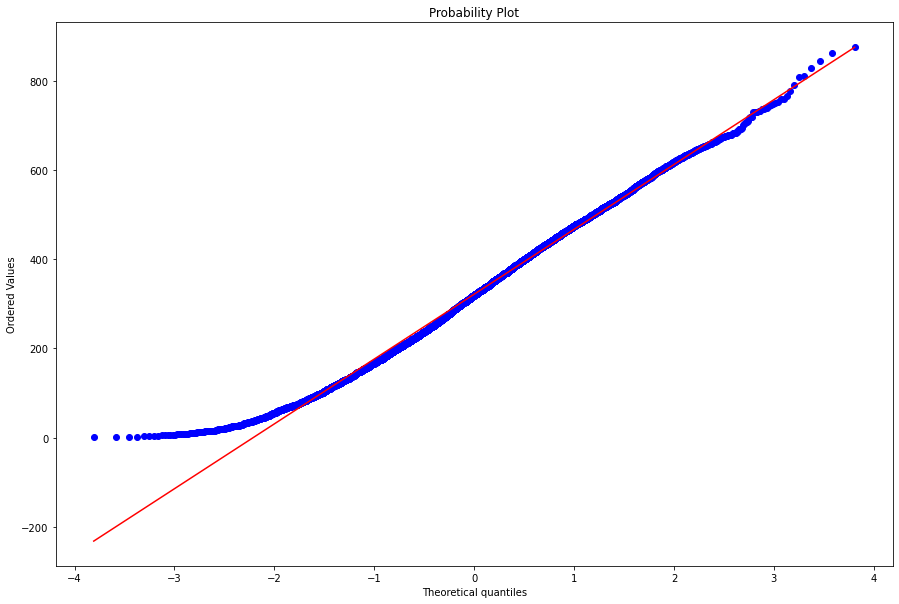

In [30]:
# create Q-Q plot for deposit amount values
fig, ax = plt.subplots(figsize=(15,10))
ss.probplot(data.query("type=='client' and depo<900")['depo'], dist="norm", plot=pylab)
pylab.show()

Q-Q plot shows that for normality the mean of deposit amount should have been a liitle bit larger, i.e. small values are more frequent contrary to the normal distribution.

In [31]:
# perform Jarque–Bera test for normality (skewness and kurtosis comparison)
stat, p = ss.jarque_bera(data.query("type=='client' and depo<1000")['depo'])
print('stat: {}, p: {}'.format(stat, p))
if p > 0.05:
    print('Do not reject the hypothesis of normal distribution')
else:
    print('Reject the hypothesis of normal distribution')

stat: 131.46089730255034, p: 0.0
Reject the hypothesis of normal distribution


So even if one excludes extreme values from sample, deposit amount values are not distributed normally. Now lets look at the exteme values.

In [32]:
# subset extreme values in a separate dataset
outliers = data.query("type=='client' and depo>=900").sort_values('depo').copy()

In [33]:
# inspect distribution across segments
print(outliers.groupby(['segment'])['depo'].count().sort_values(ascending=False))

segment
article     60
telegram    40
Name: depo, dtype: int64


In [34]:
# inspect distribution across channels
print(outliers.groupby(['channel'])['depo'].count().sort_values(ascending=False))

channel
facebook        39
smm             37
social media    11
direct          11
affiliate        1
Name: depo, dtype: int64


In [35]:
# inspect distribution across countries
print(outliers.groupby(['country'])['depo'].count().sort_values(ascending=False))

country
DE    10
LT     8
ES     8
MO     7
VN     6
US     6
IS     6
LU     5
IN     5
IT     4
FR     4
Name: depo, dtype: int64


There is no clear evidence that deposit amount outliers are distributed differently comparing to the rest of the data, since propotions across different groups are similar though not exact to the proporions in the whole dataset. However, one would expect equall occurence frequency across countries, since as we will show later users are distributed almost equally across countries. At the same time 31 row in outleires misses country value, so actually one can not say for sure whether this discrepancy is significant. 

In [36]:
print(outliers.describe())

               depo      clicks     latency
count    100.000000  100.000000  100.000000
mean   17273.930000   12.780000    3.452173
std     6153.779368   11.794178    1.889285
min     5615.000000    0.000000    0.061575
25%    12523.500000    0.000000    2.028705
50%    17006.500000   12.500000    3.000000
75%    22128.250000   20.000000    4.674072
max    31675.000000   48.000000    8.940488


Numerical columns distributions except depo also show similiraty to the corresponding distributions in the whole dataset. All in all, one can not say for sure whether these extreme values are errors. Actually, its proportion is very small relative to the whole dataset and these rows are distributed similiarly to the rows in the whole dataset across different groups. Thus, extreme values influence will not drastically affect futher aggregation. For this reason I will not drop them.

Now lets see how conversion rate varies across different groups.

# 3.1. Deposits Across Segments

Firstly, I define some functions that will be used later.

In [37]:
# create a function to calculate conversion rate (%) for the specified group
def conversion_rate(df, column):
    """"Returns coversion rates in % for each group"""
    
    lead_count = df[df['type']=='lead'].groupby([column])['type'].count()
    client_count = df[df['type']=='client'].groupby([column])['type'].count()
    
    return ((client_count*100/(lead_count+client_count)).sort_values(ascending=False))

In [38]:
# create function to compare the conversion rates across two groups
def pval(df, column, groups):
    """"Returns string indicating whether the difference in coversion rates for 2 groups is significant"""
    
    lead_count = df[df['type']=='lead'].groupby([column])['type'].count()
    lead_count = lead_count[lead_count.index.isin(groups)].values
    client_count = df[df['type']=='client'].groupby([column])['type'].count()
    client_count = client_count[client_count.index.isin(groups)].values
    overall_count = client_count+lead_count
    stat, pval = proportions_ztest(client_count, overall_count)
    
    if pval < 0.05:
        return print('The difference in coversion rates is statistically significant at 95% confidencle level.')
    else:
        return print('The difference in coversion rates is not statistically significant at 95% confidencle level.')

In [39]:
# create function to box plot deposit amount across different groups
def box_plot(df, x, title):
    """"Returns box plot for deposit amount distribution across different groups"""
    
    fig = px.box(df.query("type=='client' and depo<900"), x=x, y='depo', width=750, height=1000, points='all', color=x)
    fig.update_layout({'title': {'text':
        'Deposit Amount Box Plot across {}'.format(title),
        'x': 0.5, 'y': 0.97}})
    
    fig.show()

In [40]:
# create function to plot mean deposit amount, conversion rate and occurence frequecny across different groups
def bar_plot(df, x, conversion_rate, title):
    """"Returns plots with mean deposit amount, conversion rates and occurence frequency across different groups"""
    
    # calculate user frequency for each x
    x_freq = pd.DataFrame(df.groupby([x])['depo'].count())
    
    # calculate mean deposit and conversion rate for each channel
    xs = pd.DataFrame(df[df['type']=='client'].groupby([x])['depo'].mean().sort_index())
    xs['cr'] = conversion_rate(df, x).sort_index()
    
    # create figure
    fig, ax = plt.subplots(2,1, figsize=(15,10))
    fig.suptitle('Mean Deposit, Conversion Rate and User Frequency across {}'.format(title), fontsize=20)
    
    # create bar chart with line
    ax[0].bar(xs.index, xs['depo'], color='blue')
    ax[0].set_ylabel("Mean Deposit Amount", color='blue', fontsize=15)
    ax[0].tick_params('y', colors='blue')
    ax2 = ax[0].twinx()
    ax2.plot(xs.index, xs['cr'], color='red', marker='v')
    ax2.set_ylabel("Conversion Rate", color='red', fontsize=15)
    ax2.tick_params('y', colors='red')
    
    # create bar chart for frequency
    ax[1].bar(x_freq.index, x_freq['depo'], color='black')
    ax[1].set_ylabel("Number of Users", fontsize=15)
    
    # show the results
    plt.show()

In [41]:
# print conversion rate across segments
conversion_rate(data, 'segment')

segment
telegram    6.379666
article     3.844323
Name: type, dtype: float64

Users that come from telegram segment tend to make a deposit more frequently than those from articles. Lets check whether this difference is significant. I will use simple z-test and assume that groups are independent. The independence means that acquisition source for one usre does not affect the acqusition source for another user. In reality, it might not be the case, however.

In [42]:
# determine wthether the difference is statistically significant
pval(data, 'segment', ['article', 'telegram'])

The difference in coversion rates is statistically significant at 95% confidencle level.


Users obtained via telegram tend to convert more frequently, though one might be interested in deposit amount distribution across segments.

In [43]:
# print the mean deposit amount clients make across different segments
print(data[data['type']=='client'].groupby(['segment'])['depo'].mean())

segment
article     559.719828
telegram    385.776506
Name: depo, dtype: float64


In [47]:
data[(data['depo']<900)&(data['type']=='client')].groupby(['segment'])['depo'].mean()

segment
article     397.555278
telegram    204.456717
Name: depo, dtype: float64

In [48]:
# create deposit amount (below 900) box plot for segments
box_plot(data, 'segment', "Segments")

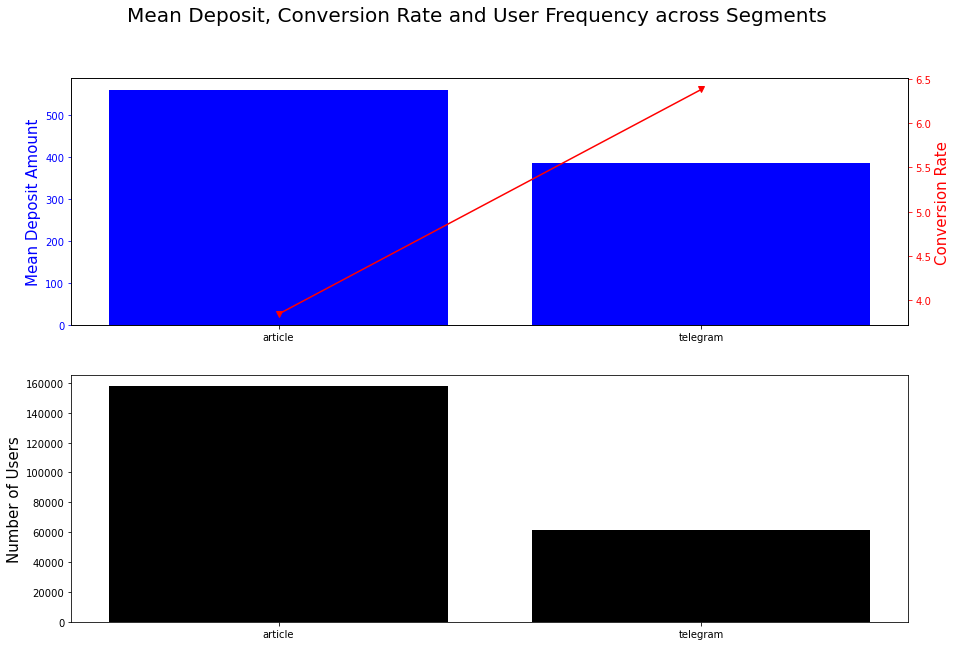

In [44]:
# plot mean deposit amount, conversion rate and occurence frequecny across segments
bar_plot(data, 'segment', conversion_rate, 'Segments')

In [49]:
# determine wthether the difference in means is statistically significant, use the assumption of unequal variances
cm = sms.CompareMeans(sms.DescrStatsW(data.query("type=='client' and segment=='article'")['depo']), sms.DescrStatsW(data.query("type=='client' and segment=='telegram'")['depo']))
if cm.tconfint_diff(usevar='unequal')[0]>0:
    print('The difference in means is statistically significant at 95% confidencle level.')
else:
    print('The difference in means is not statistically significant at 95% confidencle level.')

The difference in means is statistically significant at 95% confidencle level.


All in all, we saw that generally users come from article approximatelly two times more frequently than from telegram, however, conversion rate for telegram users is statistically higher than for article users.  A reasonable idea is to boost marketing activity in telegram, so that overall conversion rate increseas. At the same time that does not mean that one should discard article marketing activity, since in general converted article users make statistically larher deposits.

# 3.2. Deposits Across Channels.

In [50]:
# print conversion rate across channels
print(conversion_rate(data, 'channel'))

channel
smm             5.503011
facebook        5.214584
affiliate       4.884342
direct          4.593623
social media    1.807200
Name: type, dtype: float64


It looks like there are 3 different groups of channels ranked by conversion rate: 1.smm, facebook; 2.affiliate, direct; 3.social media. Since the preceding analysis showed that data is distributed similarly across different groups, lets test the sinificance in difference only between two groups. Moreover, multiple tests will lead to multiple comparisons problem.

In [51]:
# determine wthether the difference between smm and facebook cr is statistically significant
pval(data, 'channel', ['smm', 'facebook'])

The difference in coversion rates is statistically significant at 95% confidencle level.


In [52]:
# determine wthether the difference between affiliate and facebook cr is statistically significant
pval(data, 'channel', ['direct', 'facebook'])

The difference in coversion rates is statistically significant at 95% confidencle level.


In [53]:
# determine wthether the difference between affiliate and direct cr is statistically significant
pval(data, 'channel', ['social media', 'direct'])

The difference in coversion rates is statistically significant at 95% confidencle level.


Statistical analysis shows that even smm and facebook cr significantly differ. Finally, one can conclude that there exists channels with high conversion like smm and low conversion like social media.

In [54]:
# print the mean deposit amount clients make across different channels
print(data[data['type']=='client'].groupby(['channel'])['depo'].mean().sort_values(ascending=False))

channel
facebook        527.485084
direct          516.693079
smm             470.145068
social media    465.264744
affiliate       322.633962
Name: depo, dtype: float64


In [55]:
# create deposit amount (below 900) box plot for channels
box_plot(data[data['channel'].notnull()], 'channel', 'Channels')

Lets vizualize the main findings.

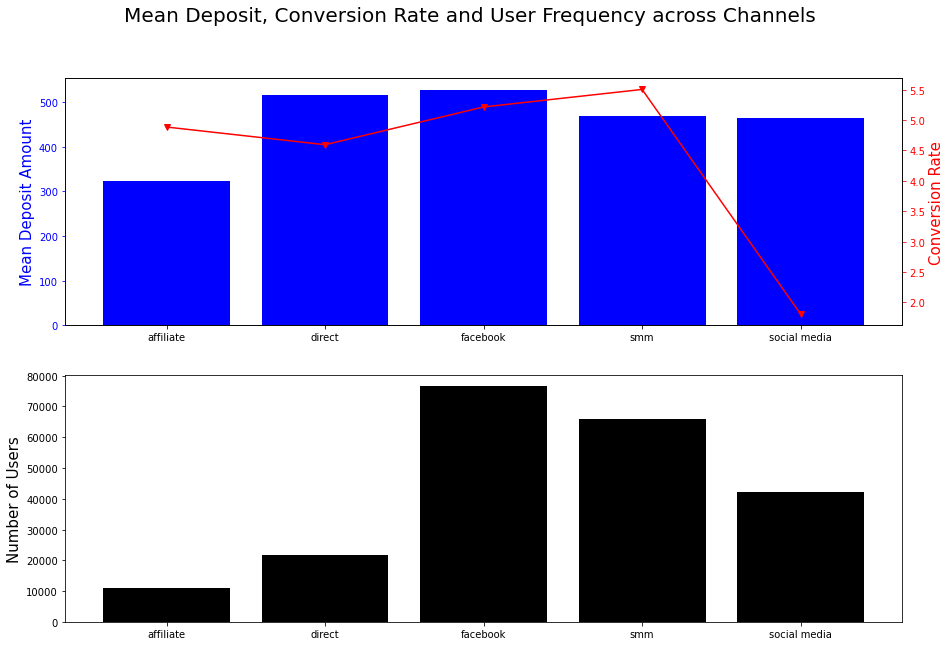

In [52]:
# plot mean deposit amount, conversion rate and occurence frequecny across channels
bar_plot(data, 'channel', conversion_rate, 'Channels')

Graphs above show that facebook and smm channels seem to be the most important: they are the most frequent, conversion rate is the highest and mean deposit amount on top. At the same time social media conversion rate is very low relatively and its frequency is high, while for affiliate channel conversion rate is high and its frequency is low. Thus, one can think of allocating resources from social media to affiliate marketing activity, yet taking into the account that mean deposit for affiliate is lower than for social media.

# 3.3. Deposits Across Countries.

In [56]:
# create deposit amount (below 900) box plot for countries
box_plot(data[data['country'].notnull()], 'country', 'Countries')

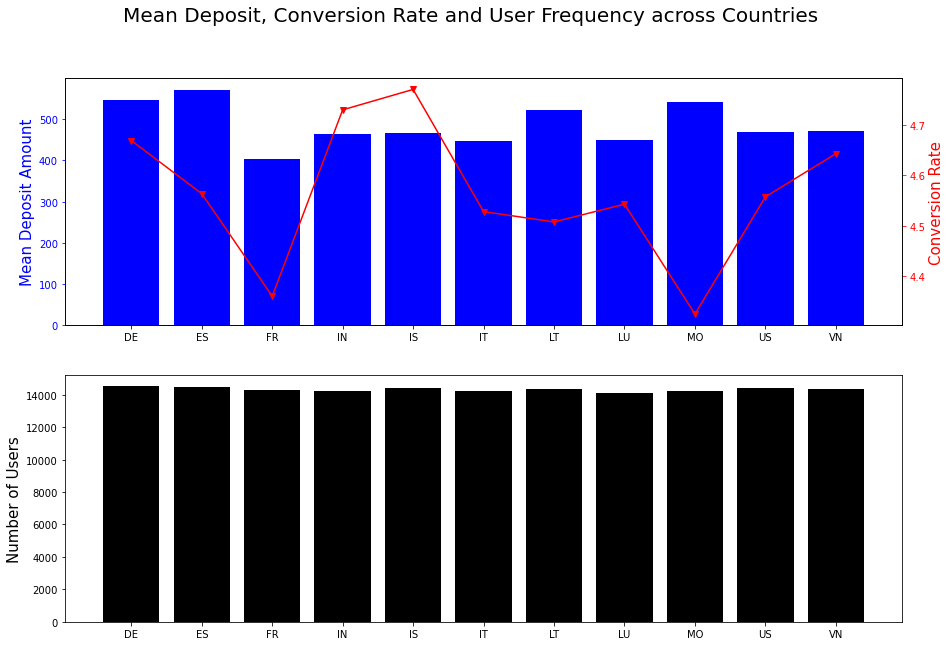

In [54]:
# plot mean deposit amount, conversion rate and occurence frequecny across countries
bar_plot(data, 'country', conversion_rate, 'Countries')

Users are distributed almost equally across countries. Conversion rate varies from one country to another, however, in relative terms this variation is very small, i.e. statistsically not significant. Variation in mean deposit is not tremendeous either, yet one can still cocnlude that DE, ES and MO have relative high mean deposit amount. 

In [55]:
# check the significance of cr difference between the highest cr country and the lowest cr country
pval(data, 'country', ['IS', 'MO'])

The difference in coversion rates is not statistically significant at 95% confidencle level.


# PART 4. LOGISTIC REGRESSION AND FACTOR SIGNIFICANCE.

In this part I will fit logistic regression to the whole dataset. I will use type variable (client, lead) as dependent variable. I will also transform categorical variables to dummies (and use reference groups). The final goal of this excercise to see the previous findings from another angle.

In [61]:
# get rid of NaN values
pred_data = data[(data['channel'].notnull())&(data['country'].notnull())].copy()

# get dummies for categorical variables (I will use segment_article, channel_social media and country_MO as reference values)
cat_cols = pd.get_dummies(pred_data[['segment', 'channel', 'country']]).drop(['segment_article', 'channel_social media', 'country_MO'], 1)

# extract numerical columns
num_cols = pred_data[['clicks', 'latency']].copy()

# merge categorical and numerical columns and extarct target
final_pred = cat_cols.merge(num_cols, how='left', on='client_id')
X = final_pred.to_numpy()
target = pred_data['type'].apply(lambda x: 1 if x=='client' else 0)
y = target.to_numpy()

# record names for independet variables
col_names = list(final_pred.columns)

In [62]:
# fit logit model using statsmodels.api module to extract pvalues
sm_model = sm.Logit(y, sm.add_constant(X)).fit(disp=0)
print(sm_model.summary())

                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:               155893
Model:                          Logit   Df Residuals:                   155875
Method:                           MLE   Df Model:                           17
Date:                Fri, 12 Nov 2021   Pseudo R-squ.:                 0.03229
Time:                        19:40:07   Log-Likelihood:                -27995.
converged:                       True   LL-Null:                       -28929.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.1150      0.071    -72.053      0.000      -5.254      -4.976
x1             0.5770      0.026     22.307      0.000       0.526       0.628
x2             1.0405      0.068     15.299      0.0

As expected, most coefficients are positive: only three coefficients are negative, one of which is a constant. The remaining two are not significant. Now lets see which coefficients are significant.

In [60]:
# create a dataframe with independent variables names, pvalues of corresponding coefficients and signficance output at different confident levels
logit_coef = pd.DataFrame(col_names)
logit_coef['pvalue'] = sm_model.pvalues[1:]
logit_coef.columns = ['variable name', 'coef p-value']
logit_coef['90% conf level'] = logit_coef['coef p-value'].apply(lambda x: 'sign' if x<0.1 else 'not sign')
logit_coef['95% conf level'] = logit_coef['coef p-value'].apply(lambda x: 'sign' if x<0.05 else 'not sign')
logit_coef['99% conf level'] = logit_coef['coef p-value'].apply(lambda x: 'sign' if x<0.01 else 'not sign')

# print the results
print(logit_coef)

        variable name   coef p-value 90% conf level 95% conf level  \
0    segment_telegram  3.146263e-110           sign           sign   
1   channel_affiliate   7.728641e-53           sign           sign   
2      channel_direct   5.911719e-58           sign           sign   
3    channel_facebook  6.333765e-119           sign           sign   
4         channel_smm  1.125791e-129           sign           sign   
5          country_DE   1.236042e-01       not sign       not sign   
6          country_ES   2.875714e-01       not sign       not sign   
7          country_FR   9.115639e-01       not sign       not sign   
8          country_IN   1.184672e-01       not sign       not sign   
9          country_IS   5.385576e-02           sign       not sign   
10         country_IT   4.102628e-01       not sign       not sign   
11         country_LT   4.081624e-01       not sign       not sign   
12         country_LU   4.630045e-01       not sign       not sign   
13         country_U

Remember that we used segment_article, channel_social media and country_MO as reference variables in logistic regression. For example, for segment group channel_telegram coefficient is significant at all levels implying that difference in probabilty of making a deposit between users that come from telegram and article is significant. In fact, as the coefficient is positive the probabilty of making a deposit is higher in telegram than in article group.

The same logic is applicable to channel group: the probability of making a deposit is significantly higher in all channels relative to social media channel. As for countries, only coefficient behind country_IS is significant at 90% level (by the way, IS is the country with the highest conversion rate). Generally, one can conlude that probability of making a depsoit across countries does not statistcally differ. Finally, the coefficient behind latency is positive and significant at all levels, which is new information. The practical interpretation is quite tricky: the more time appliccation is loading, the higher is probability a user will make a deposit.



All in all, the results of logistic regression application are in line with the previous study of conversion rates across different groups. This is not surprising since conversion rate is a way to proxy probability of making a deposit. Previously, we found that conversion rates across segments statistically differ. We also found that social media channel has the lowest conversion rate in channel group. Finally, we showed that there is no evidence of conversion rate difference between countries. Logistic regression results confirmed these findings, though in a slightly different way.

# PART 5. CLIENT TYPE PREDICTION WITH LOGISTIC REGRESSION.

In this part I will try to tune the losgistic regression model to achieve better classification measures, mostly f1 score, relative to the defalt Logistic Regression. I will also split the whole dataset into train and test splits.

Firsly, I define functions to reuse futher.

In [57]:
# create function to plot confusion matrix
def conf_matrix(y_train, pred_train):
    """"Returns a plot of confusion matrix"""
    
    # creating a confusion matrix
    con_mat = confusion_matrix(y_train, pred_train)
    con_mat = pd.DataFrame(con_mat, range(2), range(2))
   
    # ploting the confusion matrix
    plt.figure(figsize=(6,6))
    sns.set(font_scale=1.5) 
    sns.heatmap(con_mat, annot=True, annot_kws={"size": 16}, fmt='g', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix')

In [58]:
# create function to calculate classification scores
def calculate_score(y_train, pred_train):
    """"Reurns accuracy, precision, recall and f1 scores for sample binary vavriable values and predicted values"""
    
    accuracy = accuracy_score(y_train, pred_train)
    print('Accuracy is {:.3f}.'.format(accuracy))
    precision = precision_score(y_train, pred_train, zero_division=0)
    print('Precision is {:.3f}.'.format(precision))
    recall = recall_score(y_train, pred_train)
    print('Recall is {:.3f}.'.format(recall))
    f1 = f1_score(y_train, pred_train)
    print('F1 score is {:.3f}.'.format(f1))

In [59]:
# create function to plot PR curve
def plot_precision_vs_recall(precisions, recalls):
    """"Returns PR plot"""
    
    sns.set_style('whitegrid')
    plt.figure(figsize=(8, 6))
    plt.plot(recalls, precisions, linewidth=2)
    plt.xlabel("Recall", fontsize=16)
    plt.ylabel("Precision", fontsize=16)
    plt.axis([0, 1, 0, 1])
    plt.title('PR Curve')
    plt.show()

In [63]:
# devide the whole data into train and test splits
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# apply feature scaling (standard scaling) to numerical columns (these are last two rows, i.e. clikcs and latency)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X[:, -2:])
X_train[:, -2:] = scaler.fit_transform(X_train[:, -2:])
X_test[:, -2:] = scaler.fit_transform(X_test[:, -2:])

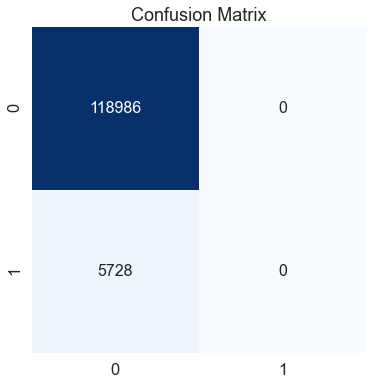

In [65]:
# fit logistic regression to the train data and record the predicted values
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
pred_train = log_reg.predict(X_train)

# plot confusion matrix 
conf_matrix(y_train, pred_train)

In [66]:
# calculate classification scores
calculate_score(y_train, pred_train)

Accuracy is 0.954.
Precision is 0.000.
Recall is 0.000.
F1 score is 0.000.


The algorithm predicted that all usres are leads. This is due to the unbalanced dependent variable, i.e. user type. In the initial dataset only 4% of users are clients and the most machine learning algorithms do not account for that fact by default.

A loss function for default linear regression is shown below. Since the number of leads in the dataset is overwhelming majority, the loss function optimization will be primarly focused on this majority. What we need is to assign weights inside the loss function, so the minority class influneces the optimization as well.

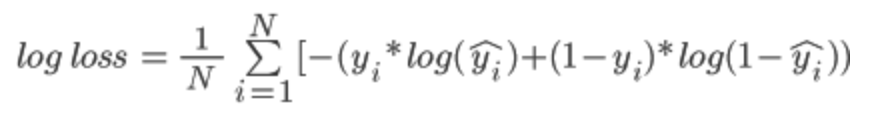

In [67]:
# show default loss function
Image("initial_lf.png")

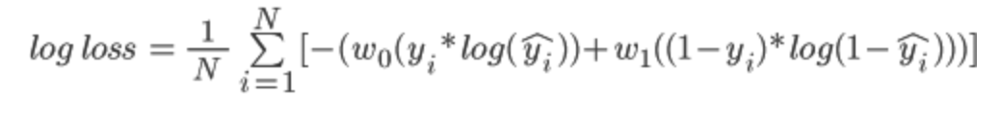

In [68]:
# show class weighted loss function
Image("weighted_lf.png")

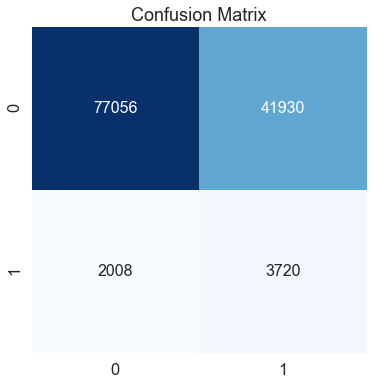

In [69]:
# fit logistic regression with class weighted loss function to the train data and record the predicted values
log_reg = LogisticRegression(class_weight='balanced')
log_reg.fit(X_train, y_train)
pred_train = log_reg.predict(X_train)

# plot confusion matrix 
conf_matrix(y_train, pred_train)

In [70]:
# calculate classification scores
calculate_score(y_train, pred_train)

Accuracy is 0.648.
Precision is 0.081.
Recall is 0.649.
F1 score is 0.145.


Now results are better, but not perfect: approximately 65% of clients are identified by the model (reccall score), but at the same time a significant number of leads are predicted to be clients, which results in low precision score.

Lets try to search for the weights that give the highets f1 score, which is a combination of recall and precision.

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  1.7min finished
/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Scoring for different class weights')

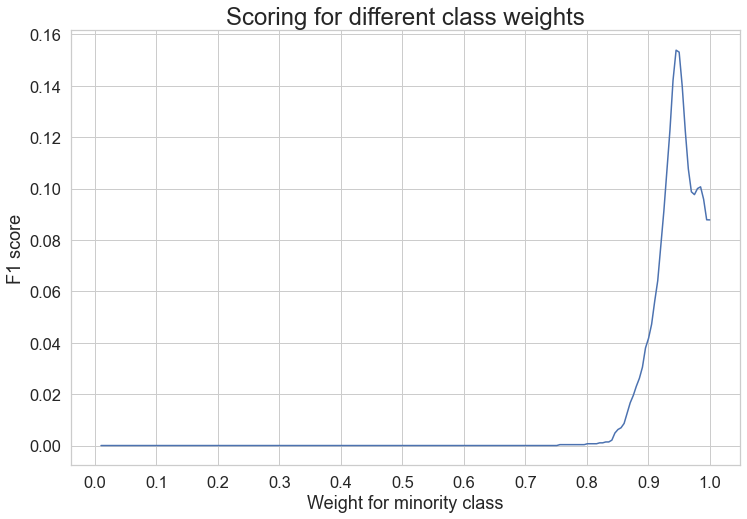

In [71]:
# initialize logistic regression
log_reg = LogisticRegression()

#Setting the range for class weights
weights = np.linspace(0.0,0.99,200)

#Creating a dictionary grid for grid search
param_grid = {'class_weight': [{0:x, 1:1.0-x} for x in weights]}

#Fitting grid search to the train data with 5 folds
gridsearch = GridSearchCV(estimator= log_reg, 
                          param_grid= param_grid,
                          cv=StratifiedKFold(), 
                          n_jobs=-1, 
                          scoring='f1', 
                          verbose=2).fit(X_train, y_train)

#Ploting the score for different values of weight
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
weigh_data = pd.DataFrame({ 'score': gridsearch.cv_results_['mean_test_score'], 'weight': (1- weights)})
sns.lineplot(weigh_data['weight'], weigh_data['score'])
plt.xlabel('Weight for minority class')
plt.ylabel('F1 score')
plt.xticks([round(i/10,1) for i in range(0,11,1)])
plt.title('Scoring for different class weights', fontsize=24)

The graph shows that the highest f1 score (about 15%) is achieved at minority class wheight about 0.95.

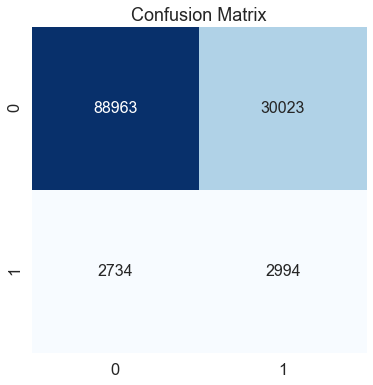

In [72]:
# extract weight for minority class which produces the highest f1 score
minor_w = weigh_data.sort_values('score', ascending=False).iloc[0,1]

# fit linear regression with manual weights to the train data
log_reg = LogisticRegression(class_weight={0: 1-minor_w, 1: minor_w})
log_reg.fit(X_train, y_train)
pred_train = log_reg.predict(X_train)

# plot confusion matrix for train data
conf_matrix(y_train, pred_train)

In [73]:
# calculate classification scores for train data
calculate_score(y_train, pred_train)

Accuracy is 0.737.
Precision is 0.091.
Recall is 0.523.
F1 score is 0.155.


We achieved a slight increase in f1 score relative to the previous result. If one is more interested in recall score (which might be the case since one would want the model to identify all clients correcltly at the cost of predicting more leads as clients), one can look at the PR curve and identify the desired threshold. However, I will not proceed with this here and will only plot the PR curve.

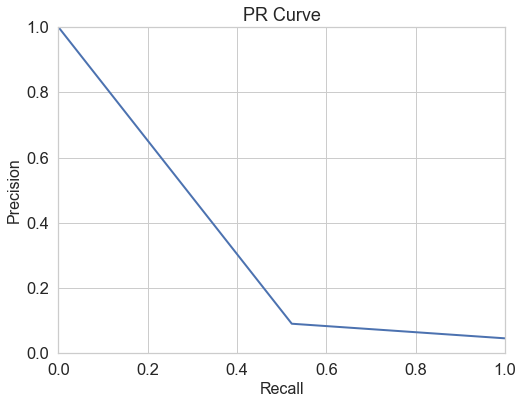

In [74]:
# record precisions, recalls, thresholds form the train data
precisions, recalls, thresholds = precision_recall_curve(y_train, pred_train)

# plot PR curve for train data
plot_precision_vs_recall(precisions, recalls)

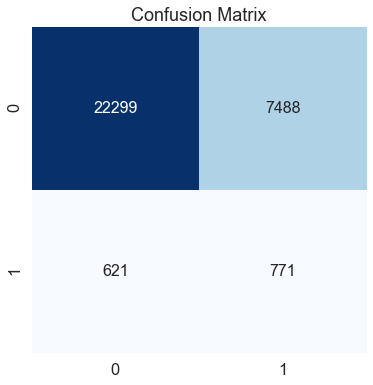

In [75]:
# get predicted values for test data
pred_test = log_reg.predict(X_test)

# plot confusion matrix for test data
conf_matrix(y_test, pred_test)

In [76]:
# calculate classification scores for test data
calculate_score(y_test, pred_test)

Accuracy is 0.740.
Precision is 0.093.
Recall is 0.554.
F1 score is 0.160.


On the test data the model performs even better than on the train data with regard to metrics above. All in all, however, the perfomance of the final model is not very good in general terms. It might be connected to unbalanced nature of dependent variable, low explanatory power of independent variables. One can try to improve it by dropping some features or picking up a more complex model.

# CONCLUSION

- No relation was found between independent categorical variables, i.e. segment, channel and country columns. Weak negative relation was found between latency and clicks. Absence of relation between independent variables is important, because it allows controlling for one independent variable while analysing dependent variable.

- Conversion rate for telegram segment was found to be statistically higher that that of article segment. Due to the fact that article segment is more frequent, one can think of boosting telegram activity so that the overall conversion rate increases. However, mean deposit amount in article segment is statistically higher than that of telegram channel, so one should find a proper balance while increasing telegram marketing activity.

- Facebook and smm channels were found to be the best in terms of converison rate and mean deposit amount. Moreover, these channels are the most frequent. Social media conversion rate was found to be statistically lower than that of other channels, however its frequency is relatively high. One can shift marketing resources from social media to affiliate channel, where conversion rate is higher.  

- No statistical difference was found in conversion rates and mean deposit amount across countries. Also users are distributed across countries almost equally.

- In terms of deposit amount some outliers were found (deposit above 5000), though their number is relative small. No anomalies were found in outliers distribution across different groups.

- Statistical logistic regression analysis confirmed all previous results. Additionaly statistically significant positive relation of latency with dependent variable was found.

- Manual class weights implementation enabled to achive better classification scores for logistic regression model. However, in general terms model perfomance leaves much to be desired. 